In [29]:
import os
import shutil
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

In [2]:
origin_dir = r'C:\Users\Administrator\Desktop\dogs_vs_cats02\dogs-vs-cats-redux-kernels-edition' 
buffer_dir = r'buffer_file'
clean_dir = r'clean_file'

train_dir = 'train'
valid_dir = 'valid'
outlier_dir = r'outlier_file'

# 不动原始文件，将原始文件复制一份到buffer_dir

In [3]:
# shutil.rmtree(buffer_dir, ignore_errors=True)
# shutil.copytree(origin_dir,buffer_dir)

# buffer_dir\\train中的文件，分类成猫狗两个文件夹

In [4]:
classification_dir = os.path.join(buffer_dir,train_dir)
for filename in os.listdir(classification_dir):
    file_type = filename.split('.')[0]
    file_path = os.path.join(classification_dir,filename)
    file_dir = os.path.join(classification_dir,file_type)
    if not os.path.exists(file_dir):
        os.mkdir(file_dir)
    shutil.move(file_path,file_dir)
print("train文件夹中的图片已经拆分为dog和cat文件夹")

train文件夹中的图片已经拆分为dog和cat文件夹


In [ ]:
model = ResNet50(weights='imagenet')

In [25]:
dogs = [
    'n02085620', 'n02085782', 'n02085936', 'n02086079'
    , 'n02086240', 'n02086646', 'n02086910', 'n02087046'
    , 'n02087394', 'n02088094', 'n02088238', 'n02088364'
    , 'n02088466', 'n02088632', 'n02089078', 'n02089867'
    , 'n02089973', 'n02090379', 'n02090622', 'n02090721'
    , 'n02091032', 'n02091134', 'n02091244', 'n02091467'
    , 'n02091635', 'n02091831', 'n02092002', 'n02092339'
    , 'n02093256', 'n02093428', 'n02093647', 'n02093754'
    , 'n02093859', 'n02093991', 'n02094114', 'n02094258'
    , 'n02094433', 'n02095314', 'n02095570', 'n02095889'
    , 'n02096051', 'n02096177', 'n02096294', 'n02096437'
    , 'n02096585', 'n02097047', 'n02097130', 'n02097209'
    , 'n02097298', 'n02097474', 'n02097658', 'n02098105'
    , 'n02098286', 'n02098413', 'n02099267', 'n02099429'
    , 'n02099601', 'n02099712', 'n02099849', 'n02100236'
    , 'n02100583', 'n02100735', 'n02100877', 'n02101006'
    , 'n02101388', 'n02101556', 'n02102040', 'n02102177'
    , 'n02102318', 'n02102480', 'n02102973', 'n02104029'
    , 'n02104365', 'n02105056', 'n02105162', 'n02105251'
    , 'n02105412', 'n02105505', 'n02105641', 'n02105855'
    , 'n02106030', 'n02106166', 'n02106382', 'n02106550'
    , 'n02106662', 'n02107142', 'n02107312', 'n02107574'
    , 'n02107683', 'n02107908', 'n02108000', 'n02108089'
    , 'n02108422', 'n02108551', 'n02108915', 'n02109047'
    , 'n02109525', 'n02109961', 'n02110063', 'n02110185'
    , 'n02110341', 'n02110627', 'n02110806', 'n02110958'
    , 'n02111129', 'n02111277', 'n02111500', 'n02111889'
    , 'n02112018', 'n02112137', 'n02112350', 'n02112706'
    , 'n02113023', 'n02113186', 'n02113624', 'n02113712'
    , 'n02113799', 'n02113978']

cats = [
    'n02123045', 'n02123159', 'n02123394', 'n02123597'
    , 'n02124075', 'n02125311', 'n02127052']

dog_dir = os.path.join(classification_dir,'dog')
cat_dir = os.path.join(classification_dir,'cat')
buffer_outlier_dir = os.path.join(buffer_dir,outlier_dir)
dog_outlier_dir = os.path.join(buffer_outlier_dir,'dog')
cat_outlier_dir = os.path.join(buffer_outlier_dir,'cat')

if not os.path.exists(buffer_outlier_dir):
    os.mkdir(buffer_outlier_dir)
    
if not os.path.exists(dog_outlier_dir):
    os.mkdir(dog_outlier_dir)
    
if not os.path.exists(cat_outlier_dir):
    os.mkdir(cat_outlier_dir)
    
# 狗的种类多，猫的种类少，因此分类中，狗占优势，将狗的topn改小一点来平衡
dog_topn = 10
cat_topn = 30

In [26]:
for index, filename in enumerate(os.listdir(dog_dir)):
    file_path = os.path.join(dog_dir, filename)
    img = image.load_img(file_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    topn_preds = decode_predictions(preds, top=dog_topn)[0]
    topn_code = [x[0] for x in topn_preds]
    is_dog = len(set(topn_code) & set(dogs)) > 0
    print("index:{},image:{},is_dog:{},info:{}".format(index, filename, is_dog, topn_code),end='\r')
    if not is_dog:
        shutil.move(file_path,dog_outlier_dir) # 将异常的图片移动到outliers文件夹
        

=====dog finish=====g.9999.jpg,is_dog:True,info:['n02091467', 'n02105162', 'n02106662', 'n02105412', 'n02105056', 'n02112350', 'n02113186', 'n02116738', 'n02097298', 'n02104365']]


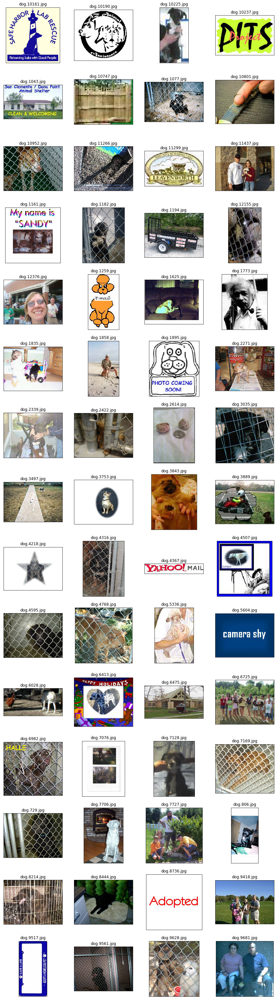

In [64]:
fig = plt.figure()
fig.set_figheight(60)
fig.set_figwidth(15)

dog_outlier_list = os.listdir(dog_outlier_dir)
dog_size = len(dog_outlier_list)
size = int((dog_size / 4) + 1)
for i, filename in enumerate(dog_outlier_list):
    im_path = os.path.join(dog_outlier_dir, filename)
    im = Image.open(im_path)
    index = i + 1
    fig.add_subplot(size,4,index)
    plt.imshow(im)
    plt.title(filename)
    plt.xticks([])
    plt.yticks([])
        
plt.show()

In [27]:
for index, filename in enumerate(os.listdir(cat_dir)):
    file_path = os.path.join(cat_dir, filename)
    img = image.load_img(file_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    preds = model.predict(x)
    topn_preds = decode_predictions(preds, top=cat_topn)[0]
    topn_code = [x[0] for x in topn_preds]
    is_cat = len(set(topn_code) & set(cats)) > 0
    print("index:{},image:{},is_cat:{},info:{}".format(index, filename, is_cat,topn_code),end='\r')
    if not is_cat:
        shutil.move(file_path,cat_outlier_dir) # 将异常的图片移动到outliers文件夹

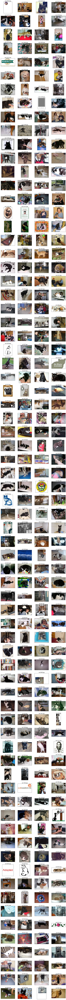

In [65]:
fig = plt.figure()
fig.set_figheight(240)
fig.set_figwidth(15)

cat_outlier_list = os.listdir(cat_outlier_dir)
cat_size = len(cat_outlier_list)
size = int((cat_size / 4) + 1)
for i, filename in enumerate(cat_outlier_list):
    im_path = os.path.join(cat_outlier_dir, filename)
    im = Image.open(im_path)
    index = i + 1
    fig.add_subplot(size,4,index)
    plt.imshow(im)
    plt.title(filename)
    plt.xticks([])
    plt.yticks([])
        
plt.show()

# 新的发现，在猫文件夹中的图片，有很多是猫狗混合的，这些数据必须被剔除

# 最后，手动把这些图片放到images文件夹中，手动分出训练集和验证集